In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, UpSampling2D, InputLayer
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint

In [2]:

# Paths to the dataset
image_dir = "/kaggle/input/semantic-segmentation-of-underwater-imagery-suim/train_val/images"
mask_dir = "/kaggle/input/semantic-segmentation-of-underwater-imagery-suim/train_val/masks"

# Image size (resize all images to this size)
IMG_HEIGHT, IMG_WIDTH = 256, 256
NUM_CLASSES = 8  # Define the number of classes in the SUIM dataset (you can modify this)

# Load the images and masks
def load_data(image_dir, mask_dir):
    images = []
    masks = []
    
    image_filenames = os.listdir(image_dir)
    image_filenames = sorted(image_filenames)
    mask_filenames = os.listdir(mask_dir)
    mask_filenames = sorted(mask_filenames)
    for image_filename in image_filenames:
        # Load image
        img = cv2.imread(os.path.join(image_dir, image_filename))
        img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT))
        images.append(img)
        
    for mask_filename in mask_filenames:
        # Load corresponding mask
        mask = cv2.imread(os.path.join(mask_dir, mask_filename))
        mask = cv2.resize(mask, (IMG_WIDTH, IMG_HEIGHT))
        masks.append(mask)
    
    return np.array(images), np.array(masks)


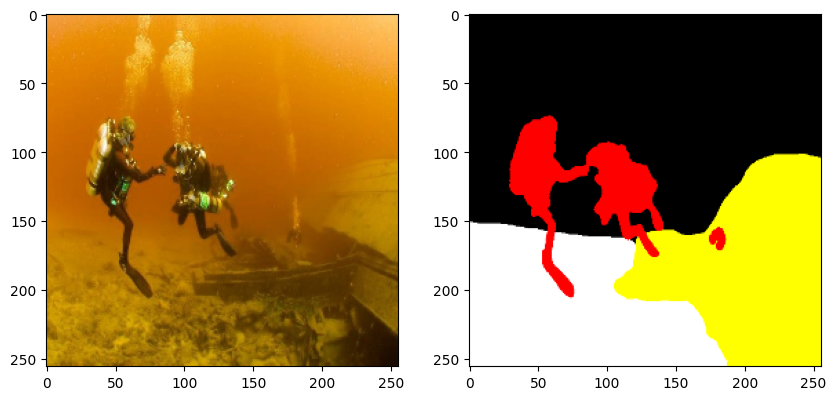

In [3]:
images, masks = load_data(image_dir, mask_dir)
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(images[0])
axs[1].imshow(masks[0])
plt.show()

In [4]:
import numpy as np
from PIL import Image
import os

# Define the color-to-class mapping
color_to_class = {
    (0, 0, 0): 0,         # Background (waterbody)
    (0, 0, 255): 1,       # Human divers
    (0, 255, 0): 2,       # Aquatic plants and sea-grass
    (0, 255, 255): 3,     # Wrecks and ruins
    (255, 0, 0): 4,       # Robots (AUVs/ROVs/instruments)
    (255, 0, 255): 5,     # Reefs and invertebrates
    (255, 255, 0): 6,     # Fish and vertebrates
    (255, 255, 255): 7    # Sea-floor and rocks
}

def mask_to_class(mask, color_to_class):
    mask_rgb = np.array(mask)  # Convert mask to a numpy array
    height, width, _ = mask_rgb.shape
    label_mask = np.zeros((height, width, 8), dtype=np.float32)  # Initialize the class label mask with 8 channels

    # Iterate over the color-to-class mapping and assign class ids
    for rgb, class_id in color_to_class.items():
        # Create a mask where the color matches the current RGB tuple
        match = np.all(mask_rgb == rgb, axis=-1)
        label_mask[:, :, class_id] = match.astype(np.float32)  # Assign 1 to the matching pixels in the corresponding channel

    # print(label_mask.shape)
    return label_mask

# Directory to save class masks
output_dir = "/class_masks"
os.makedirs(output_dir, exist_ok=True)
class_masks=[]
# Process all mask images
for i, mask_image in enumerate(masks):
    # Convert the RGB mask to a class index mask
    class_mask = mask_to_class(mask_image, color_to_class)
    class_masks.append(class_mask)

In [5]:
import os
import numpy as np
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(images, class_masks, test_size=0.2, random_state=42)

# Check the number of samples in each split
print(f"Training samples: {len(X_train)}, Testing samples: {len(X_test)}")

# Now you can use X_train and X_test for training and testing

Training samples: 1220, Testing samples: 305


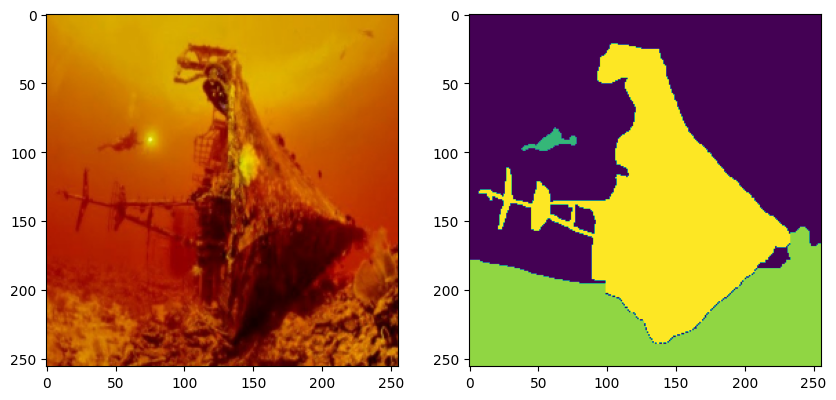

In [6]:
from matplotlib import pyplot as plt
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(X_train[0])
axs[1].imshow(np.argmax(y_train[0],axis=2))
plt.show()

In [7]:
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))

1220
1220
305
305


In [8]:
def dice_loss(y_true, y_pred, smooth=1e-6):
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    dice_coef = (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)
    return 1 - dice_coef

def bce_dice_loss(y_true, y_pred):
    # Binary Crossentropy
    bce_loss = tf.keras.losses.BinaryCrossentropy(from_logits=False)
    bce = bce_loss(y_true, y_pred)

    # Dice loss
    dice = dice_loss(y_true, y_pred)

    # Combine the losses
    combined_loss = 0.5 * bce + 0.5 * dice
    return combined_loss

In [13]:
from tensorflow.keras.layers import Dropout, BatchNormalization
from tensorflow.keras.models import Sequential,Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Input,Flatten, Dense,concatenate, Dropout, BatchNormalization, Activation, UpSampling2D
from tensorflow.keras.optimizers import Adam

def build_unet(input_shape, num_classes):
    inputs = Input(input_shape)
    
    # Encoder (downsampling path)
    conv1 = Conv2D(16, (3, 3), activation='relu', padding='same')(inputs)
    conv1 = BatchNormalization()(conv1)
    conv1 = Conv2D(16, (3, 3), activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    pool1 = Dropout(0.3)(pool1)

    conv2 = Conv2D(32, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = BatchNormalization()(conv2)
    conv2 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    pool2 = Dropout(0.3)(pool2)

    conv3 = Conv2D(64, (3, 3), activation='relu', padding='same')(pool2)
    conv3 = BatchNormalization()(conv3)
    conv3 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
    pool3 = Dropout(0.4)(pool3)

    # Decoder (upsampling path)
    up4 = UpSampling2D(size=(2, 2))(conv3)
    up4 = concatenate([up4, conv2], axis=-1)
    conv4 = Conv2D(32, (3, 3), activation='relu', padding='same')(up4)
    conv4 = BatchNormalization()(conv4)
    conv4 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv4)
    
    up5 = UpSampling2D(size=(2, 2))(conv4)
    up5 = concatenate([up5, conv1], axis=-1)
    conv5 = Conv2D(16, (3, 3), activation='relu', padding='same')(up5)
    conv5 = BatchNormalization()(conv5)
    conv5 = Conv2D(16, (3, 3), activation='relu', padding='same')(conv5)
    
    # Output layer
    conv6 = Conv2D(num_classes, (1, 1), activation='softmax', padding='same')(conv5)
    
    # Model definition
    model = Model(inputs=[inputs], outputs=[conv6])
    
    model.compile(optimizer=Adam(), loss=bce_dice_loss, metrics=['accuracy'])
    
    return model

input_shape = (256, 256, 3)  
num_classes = 8  # Number of segmentation classes

model = build_unet(input_shape, num_classes)
model.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_11 (Conv2D)  │ (None, 256, 256,  │        448 │ input_layer_1[0]… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │         64 │ conv2d_11[0][0]   │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_12 (Conv2D)  │ (None, 256, 256,  │      2,320 │ batch_normalizat… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 128, 128,  │          0 │ conv2d_12[0][0]   │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 128, 128,  │          0 │ max_pooling2d_3[… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_13 (Conv2D)  │ (None, 128, 128,  │      4,640 │ dropout_3[0][0]   │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        128 │ conv2d_13[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_14 (Conv2D)  │ (None, 128, 128,  │      9,248 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_4     │ (None, 64, 64,    │          0 │ conv2d_14[0][0]   │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_4 (Dropout) │ (None, 64, 64,    │          0 │ max_pooling2d_4[… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_15 (Conv2D)  │ (None, 64, 64,    │     18,496 │ dropout_4[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        256 │ conv2d_15[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_16 (Conv2D)  │ (None, 64, 64,    │     36,928 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_2     │ (None, 128, 128,  │          0 │ conv2d_16[0][0]   │
│ (UpSampling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 128, 128,  │          0 │ up_sampling2d_2[… │
│ (Concatenate)       │ 96)               │            │ conv2d_14[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_17 (Conv2D)  │ (None, 128, 128,  │     27,680 │ concatenate_2[0]

 Total params: 119,032 (464.97 KB)

 Trainable params: 118,712 (463.72 KB)

 Non-trainable params: 320 (1.25 KB)

In [14]:
y_train = np.array(y_train).reshape((1220, 256, 256, 8))

In [15]:
y_test =np.array(y_test).reshape((305, 256, 256, 8))

In [19]:
# Train the model
# print(X_train.shape,y_train.shape)
history = model.fit(X_train, y_train, epochs=60, batch_size=16, validation_data=(X_test, y_test))


Epoch 1/60
77/77 ━━━━━━━━━━━━━━━━━━━━ 7s 90ms/step - accuracy: 0.6631 - loss: 0.2802 - val_accuracy: 0.6316 - val_loss: 0.3083
Epoch 2/60
77/77 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6671 - loss: 0.2776 - val_accuracy: 0.6753 - val_loss: 0.2755
Epoch 3/60
77/77 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6784 - loss: 0.2681 - val_accuracy: 0.6321 - val_loss: 0.3072
Epoch 4/60
77/77 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.6698 - loss: 0.2749 - val_accuracy: 0.6551 - val_loss: 0.2875
Epoch 5/60
77/77 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6666 - loss: 0.2782 - val_accuracy: 0.6639 - val_loss: 0.2848
Epoch 6/60
77/77 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6639 - loss: 0.2823 - val_accuracy: 0.6650 - val_loss: 0.2820
Epoch 7/60
77/77 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - accuracy: 0.6716 - loss: 0.2746 - val_accuracy: 0.6463 - val_loss: 0.2963
Epoch 8/60
77/77 ━━━━━━━━━━━━━━━━━━━━ 5s 69ms/step - accuracy: 0.6806 - loss: 0.2680 - val_accuracy: 0.6660 - v

10/10 ━━━━━━━━━━━━━━━━━━━━ 7s 334ms/step - accuracy: 0.6663 - loss: 0.2821
Test Accuracy: 0.6568
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step


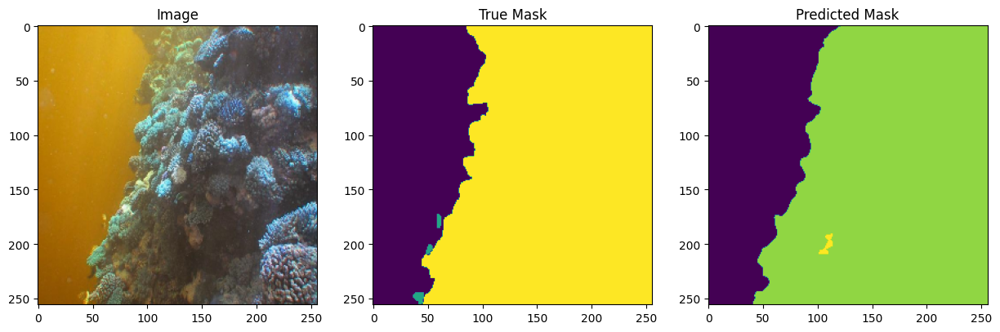

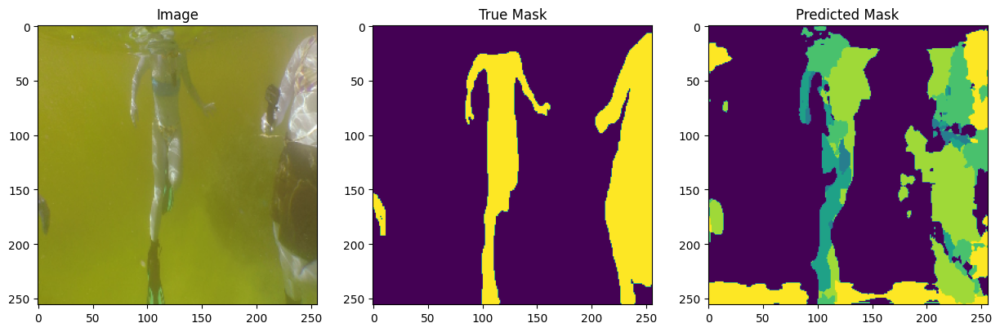

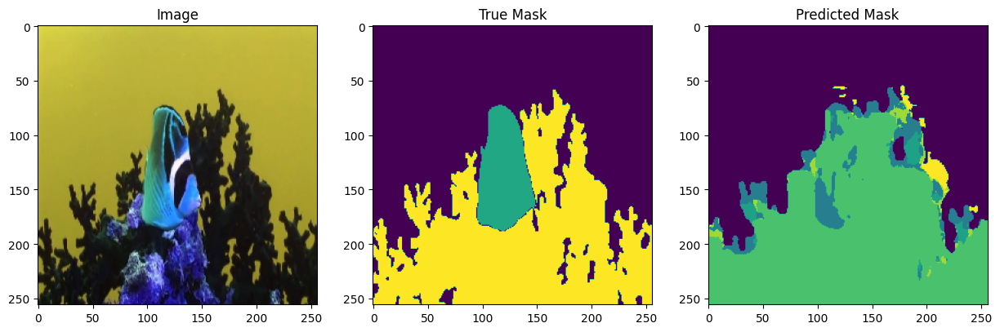

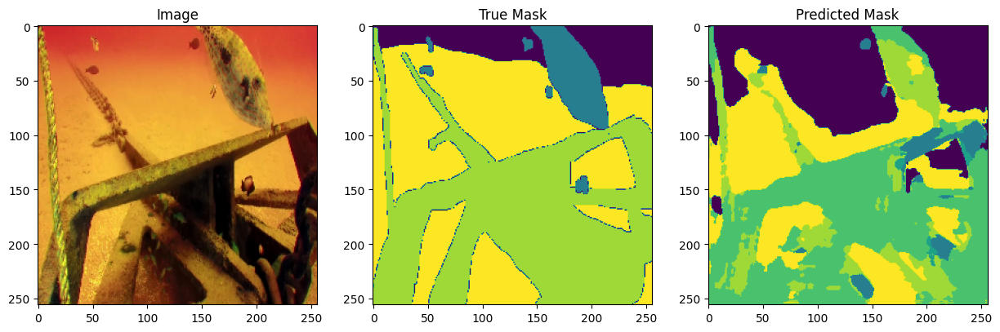

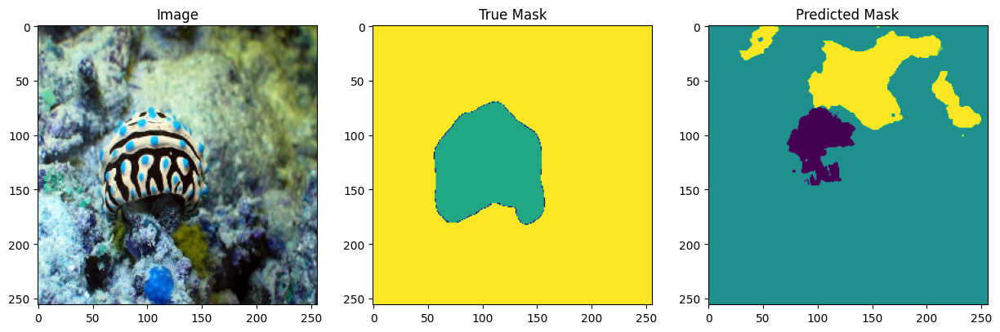

...

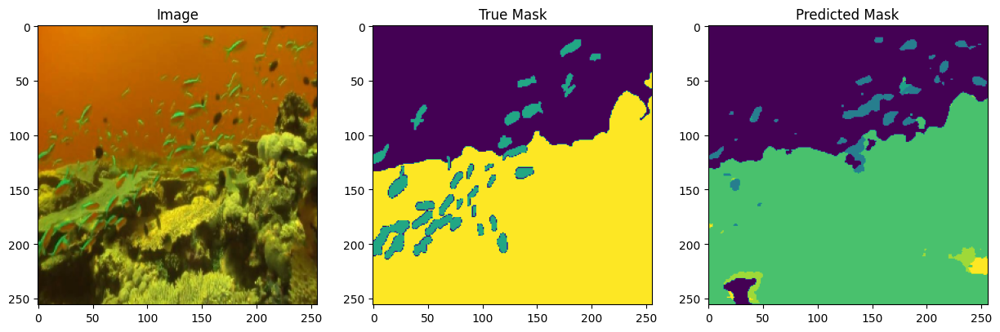

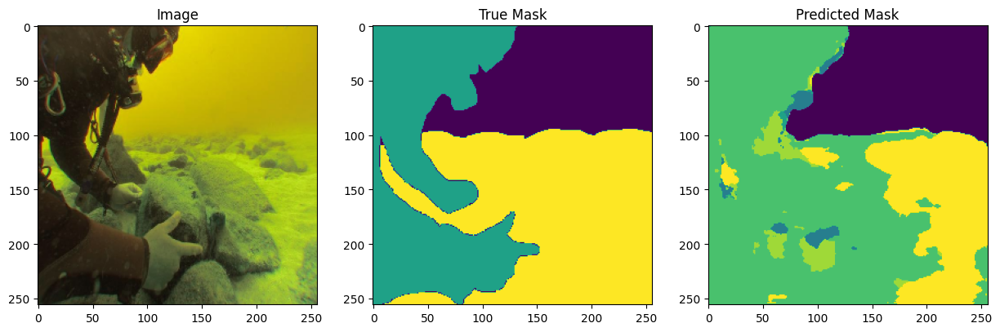

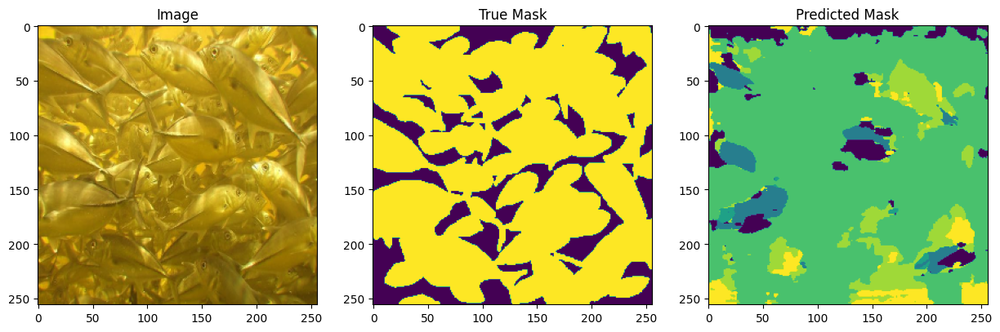

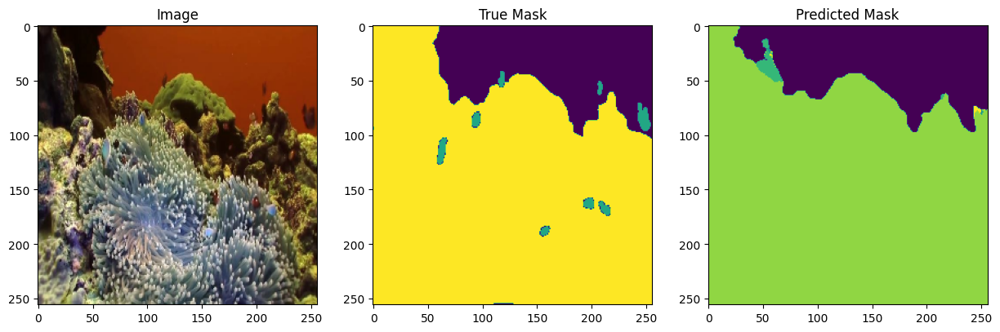

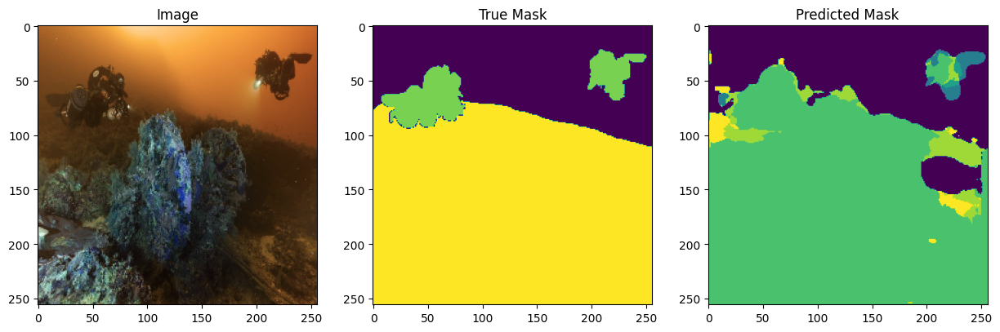

In [17]:
# Evaluate the model
loss, acc = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {acc:.4f}")

# Predict the masks for the test set
y_pred = model.predict(X_test)

# Plotting function for results (image, true mask, and predicted mask)
def plot_sample(image, mask_true, mask_pred):
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    
    axs[0].imshow(image)
    axs[0].set_title("Image")
    
    axs[1].imshow(np.argmax(mask_true, axis=2))
    axs[1].set_title("True Mask")
    
    axs[2].imshow(np.argmax(mask_pred, axis=2))
    axs[2].set_title("Predicted Mask")
    
    plt.show()

# Visualize the results
for i in range(50):
    sample_img = X_test[i]
    sample_true_mask = y_test[i]
    sample_pred_mask = y_pred[i]
    
    plot_sample(sample_img, sample_true_mask, sample_pred_mask)


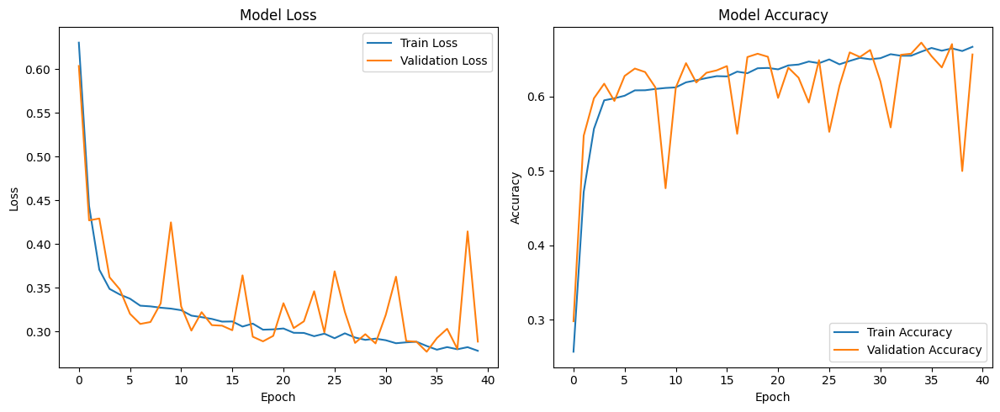

In [18]:
import matplotlib.pyplot as plt

def plot_loss_accuracy(history):
    # Plot training & validation loss values
    plt.figure(figsize=(12, 5))

    # Plot loss
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend(loc='upper right')

    # Plot accuracy
    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend(loc='lower right')

    plt.tight_layout()
    plt.show()

# Example usage
# history = model.fit(...)  # Assuming you have trained the model and history is returned
plot_loss_accuracy(history)
